In [2]:
%matplotlib widget
import inspect
import math
import re

import matplotlib.pyplot as plt
import numpy as np
import torch
import warp as wp

from warpSPHCore import *
from warpSPHCore.util import generateNeighborTestData

# Initialize Warp
wp.config.verify_autograd_array_access = False
wp.config.verbose = False
wp.init()

def debugPrint(x):
    frame = inspect.currentframe().f_back
    s = inspect.getframeinfo(frame).code_context[0]
    r = re.search(r"\((.*)\)", s).group(1)
    print("{} [{}] = {}".format(r, type(x).__name__, x))

def plot_scalar_field(ax, positions, values, title, *, cmap="viridis", marker_size=2, domain=None):
    sc = ax.scatter(positions[:, 0].cpu(), positions[:, 1].cpu(), c=values.cpu(), cmap=cmap, s=marker_size)
    ax.figure.colorbar(sc, ax=ax, shrink=0.95)
    ax.set_title(title)
    ax.set_xlabel("X")
    ax.set_ylabel("Y")
    ax.set_aspect("equal")
    if domain is not None:
        ax.set_xlim(domain.min[0].item(), domain.max[0].item())
        ax.set_ylim(domain.min[1].item(), domain.max[1].item())
    return sc

def make_matrix_field(x, y, field_mode):
    if field_mode == "periodic_sinusoidal":
        return torch.stack((
            torch.stack((torch.sin(math.pi * x), torch.cos(math.pi * y)), dim=-1),
            torch.stack((torch.cos(math.pi * x), torch.sin(math.pi * y)), dim=-1),
        ), dim=1)
    return torch.stack((
        torch.stack((1.5 * x + 0.25 * y, -0.5 * x + 0.75 * y), dim=-1),
        torch.stack((0.2 * x - 1.1 * y, -1.0 * x + 0.3 * y), dim=-1),
    ), dim=1)

def analytic_matrix_divergence(x, y, field_mode):
    out = torch.zeros((x.shape[0], 2), device=x.device, dtype=x.dtype)
    if field_mode == "periodic_sinusoidal":
        out[:, 0] = math.pi * torch.cos(math.pi * x) - math.pi * torch.sin(math.pi * y)
        out[:, 1] = -math.pi * torch.sin(math.pi * x) + math.pi * torch.cos(math.pi * y)
    else:
        out[:, 0] = 1.5 + 0.75
        out[:, 1] = 0.2 + 0.3
    return out

def make_linear_vector_field(x, y):
    return torch.stack((2.0 * x + y, -x + 0.5 * y), dim=-1)

def make_jittered_particles(base_positions, base_supports, base_masses, base_kinds, jitter_scale, dx):
    jittered_positions = (base_positions + jitter_scale * dx * torch.randn_like(base_positions)).contiguous()
    return ParticleState(
        positions=jittered_positions,
        supports=base_supports.contiguous(),
        masses=base_masses.contiguous(),
        densities=None,
        kinds=base_kinds,
    )

Warp DeprecationWarning: warp.config.verbose is deprecated; use warp.config.log_level = warp.LOG_DEBUG instead.


Warp 1.15.0 initialized:
   CUDA Toolkit 12.9, Driver 13.3
   Devices:
     "cpu"      : "CPU"
     "cuda:0"   : "NVIDIA GeForce RTX 3090" (24 GiB, sm_86, mempool enabled)
   Kernel cache:
     /home/veldora/.cache/warp/1.15.0


In [4]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
targetNumNeighbors = 50
nx = 128
dim = 2
numParticles = nx ** dim

warpOnly = False
periodic = True
field_mode = "linear"  # "linear" or "periodic_sinusoidal"
mask_edge_particles = True
jitter = 0.05

kernel = KernelFunctions.Wendland2
supportMode = SupportScheme.SuperSymmetric

markerSize = 8 if warpOnly else 2
gridVisualization = False
gridResolution = 128
dx = 2.0 / nx

positions, supports, _, domain, dx = generateNeighborTestData(
    nx, targetNumNeighbors, dim, periodic, device
)

masses = torch.full((positions.shape[0],), dx ** dim, device=device, dtype=positions.dtype)
kinds = torch.zeros(positions.shape[0], device=device, dtype=torch.int32)

particles = ParticleState(
    positions=positions.contiguous(),
    supports=supports.contiguous(),
    masses=masses.contiguous(),
    densities=None,
    kinds=kinds,
)

adjacency = radiusSearchCompactHashMap(
    particles,
    domain,
    mode=SupportScheme.SuperSymmetric,
)

densities = warpOperation(
    particles,
    OperationProperties(
        kernel=kernel,
        operation=WarpOperation.Density,
        supportMode=SupportScheme.Gather,
        operationMode=OperationDirection.AllToAll,
    ),
    domain,
    adjacency=adjacency,
)
particles.densities = densities

matrix_field = make_matrix_field(positions[:, 0], positions[:, 1], field_mode)
analytic_divergence = analytic_matrix_divergence(positions[:, 0], positions[:, 1], field_mode)

plot_mask = torch.ones(positions.shape[0], dtype=torch.bool, device=positions.device)
if field_mode == "linear" and mask_edge_particles:
    band = 4.0 * dx
    for axis_idx in range(dim):
        plot_mask = plot_mask & (positions[:, axis_idx] > domain.min[axis_idx] + band)
        plot_mask = plot_mask & (positions[:, axis_idx] < domain.max[axis_idx] - band)

jittered_particles = make_jittered_particles(
    positions,
    supports,
    masses,
    kinds,
    jitter,
    dx,
)
jittered_adjacency = radiusSearchCompactHashMap(
    jittered_particles,
    domain,
    mode=SupportScheme.SuperSymmetric,
)
jittered_densities = warpOperation(
    jittered_particles,
    OperationProperties(
        kernel=kernel,
        operation=WarpOperation.Density,
        supportMode=SupportScheme.Gather,
        operationMode=OperationDirection.AllToAll,
    ),
    domain,
    adjacency=jittered_adjacency,
)
jittered_particles.densities = jittered_densities

apparent_area, crk_density, crk_state = computeCRKFactors(
    jittered_particles,
    domain,
    kernel,
    operationMode=OperationDirection.AllToAll,
    adjacency=jittered_adjacency,
)

Module warpSPHCore.crk.crk_volume 401651a load on device 'cuda:0' took 5.01 ms  (cached)
Module warpSPHCore.crk.crk_moments 6686e30 load on device 'cuda:0' took 7.41 ms  (cached)
Module warpSPHCore.crk.crk_density efa2365 load on device 'cuda:0' took 4.72 ms  (cached)


Module warpSPHCore.operations.wp_divergence 179cd13 load on device 'cuda:0' took 9320.75 ms  (compiled)
Matrix divergence mean abs error: 2.814824104309082


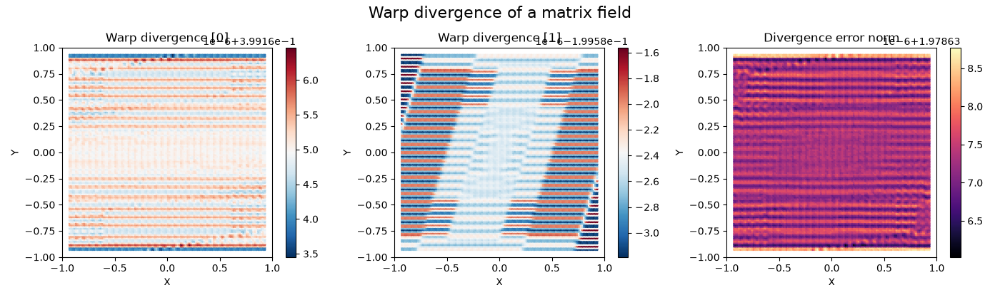

In [5]:
matrix_divergence_warp = warpOperation(
    particles,
    queryValues=matrix_field,
    referenceValues=matrix_field,
    operationProperties=OperationProperties(
        kernel=kernel,
        supportMode=supportMode,
        operation=WarpOperation.Divergence,
        gradientMode=GradientScheme.Difference,
        operationMode=OperationDirection.AllToAll,
    ),
    adjacency=adjacency,
    domain=domain,
)

matrix_divergence_error = torch.abs(matrix_divergence_warp - analytic_divergence)

fig, axis = plt.subplots(1, 3, figsize=(14, 4), squeeze=False)
plot_scalar_field(axis[0, 0], positions[plot_mask], matrix_divergence_warp[:, 0][plot_mask], "Warp divergence [0]", cmap="RdBu_r", marker_size=markerSize, domain=domain)
plot_scalar_field(axis[0, 1], positions[plot_mask], matrix_divergence_warp[:, 1][plot_mask], "Warp divergence [1]", cmap="RdBu_r", marker_size=markerSize, domain=domain)
plot_scalar_field(axis[0, 2], positions[plot_mask], matrix_divergence_error.norm(dim=1)[plot_mask], "Divergence error norm", cmap="magma", marker_size=markerSize, domain=domain)
fig.suptitle("Warp divergence of a matrix field", fontsize=16)
fig.tight_layout()
print("Matrix divergence mean abs error:", matrix_divergence_error.mean().item())


Plain matrix divergence MAE: 1.385345697402954
CRK matrix divergence MAE: 1.385848879814148


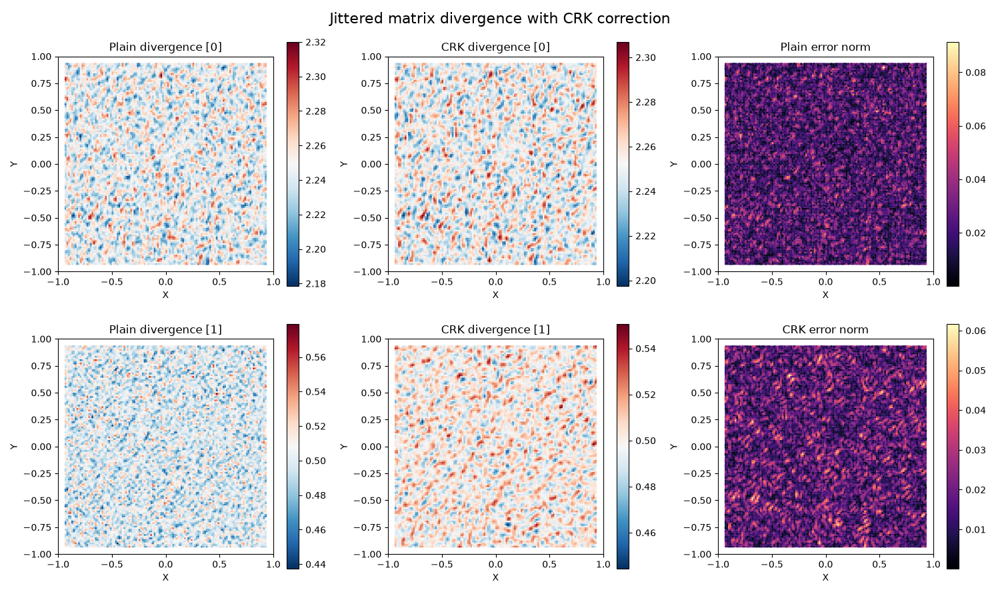

In [10]:
matrix_divergence_plain_jittered = warpOperation( # This is the difference of div/dot mode in divergence operation, which is why we need to use the transposed matrix field for both query and reference values. This should be fixed in the api to expose the different modes more clearly.
    jittered_particles,
    queryValues=matrix_field.mT.contiguous(),
    referenceValues=matrix_field.mT.contiguous(),
    operationProperties=OperationProperties(
        kernel=kernel,
        supportMode=supportMode,
        operation=WarpOperation.Divergence,
        gradientMode=GradientScheme.Difference,
        operationMode=OperationDirection.AllToAll,
    ),
    adjacency=jittered_adjacency,
    domain=domain,
)

matrix_divergence_crk = warpOperation(
    jittered_particles,
    queryValues=matrix_field.mT.contiguous(),
    referenceValues=matrix_field.mT.contiguous(),
    operationProperties=OperationProperties(
        kernel=kernel,
        supportMode=SupportScheme.SuperSymmetric,
        operation=WarpOperation.Divergence,
        gradientMode=GradientScheme.Difference,
        operationMode=OperationDirection.AllToAll,
    ),
    adjacency=jittered_adjacency,
    domain=domain,
    crkState=crk_state,
    queryVolumes=apparent_area,
    referenceVolumes=apparent_area,
)

matrix_divergence_plain_error = torch.abs(matrix_divergence_plain_jittered - analytic_divergence)
matrix_divergence_crk_error = torch.abs(matrix_divergence_crk - analytic_divergence)

fig, axis = plt.subplots(2, 3, figsize=(15, 9), squeeze=False)
plot_scalar_field(axis[0, 0], jittered_particles.positions[plot_mask], matrix_divergence_plain_jittered[:, 0][plot_mask], "Plain divergence [0]", cmap="RdBu_r", marker_size=markerSize, domain=domain)
plot_scalar_field(axis[1, 0], jittered_particles.positions[plot_mask], matrix_divergence_plain_jittered[:, 1][plot_mask], "Plain divergence [1]", cmap="RdBu_r", marker_size=markerSize, domain=domain)
plot_scalar_field(axis[0, 1], jittered_particles.positions[plot_mask], matrix_divergence_crk[:, 0][plot_mask], "CRK divergence [0]", cmap="RdBu_r", marker_size=markerSize, domain=domain)
plot_scalar_field(axis[1, 1], jittered_particles.positions[plot_mask], matrix_divergence_crk[:, 1][plot_mask], "CRK divergence [1]", cmap="RdBu_r", marker_size=markerSize, domain=domain)
plot_scalar_field(axis[0, 2], jittered_particles.positions[plot_mask], matrix_divergence_plain_error.norm(dim=1)[plot_mask], "Plain error norm", cmap="magma", marker_size=markerSize, domain=domain)
plot_scalar_field(axis[1, 2], jittered_particles.positions[plot_mask], matrix_divergence_crk_error.norm(dim=1)[plot_mask], "CRK error norm", cmap="magma", marker_size=markerSize, domain=domain)
fig.suptitle("Jittered matrix divergence with CRK correction", fontsize=16)
fig.tight_layout()
print("Plain matrix divergence MAE:", matrix_divergence_plain_error.mean().item())
print("CRK matrix divergence MAE:", matrix_divergence_crk_error.mean().item())


Vector divergence Warp MAE: 2.500000238418579
Vector divergence plain jittered MAE: 2.51468563079834
Vector divergence CRK MAE: 2.5174520015716553


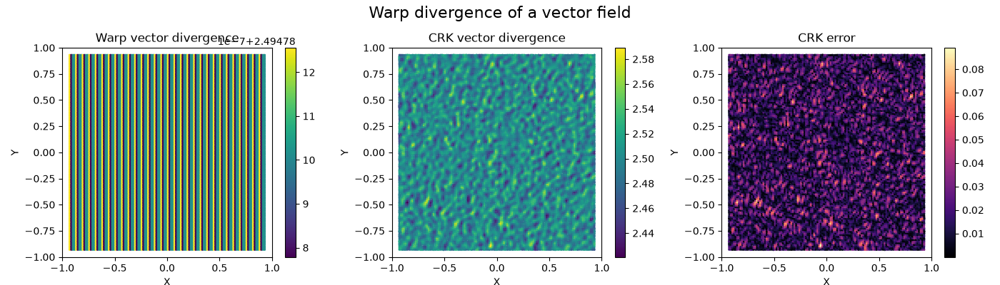

In [12]:
vector_x = positions[:, 0]
vector_y = positions[:, 1]
if field_mode == "periodic_sinusoidal":
    vector_field = torch.stack((torch.sin(math.pi * vector_x), torch.cos(math.pi * vector_y)), dim=-1)
    analytic_vector_divergence = math.pi * torch.cos(math.pi * vector_x) - math.pi * torch.sin(math.pi * vector_y)
else:
    vector_field = make_linear_vector_field(vector_x, vector_y)
    analytic_vector_divergence = torch.full((positions.shape[0],), 2.5, device=device, dtype=positions.dtype)

vector_divergence_warp = warpOperation(
    particles,
    queryValues=vector_field,
    referenceValues=vector_field,
    operationProperties=OperationProperties(
        kernel=kernel,
        supportMode=supportMode,
        operation=WarpOperation.Divergence,
        gradientMode=GradientScheme.Difference,
        operationMode=OperationDirection.AllToAll,
    ),
    adjacency=adjacency,
    domain=domain,
).squeeze()

vector_divergence_plain_jittered = warpOperation(
    jittered_particles,
    queryValues=vector_field,
    referenceValues=vector_field,
    operationProperties=OperationProperties(
        kernel=kernel,
        supportMode=supportMode,
        operation=WarpOperation.Divergence,
        gradientMode=GradientScheme.Difference,
        operationMode=OperationDirection.AllToAll,
    ),
    adjacency=jittered_adjacency,
    domain=domain,
).squeeze()

vector_divergence_crk = warpOperation(
    jittered_particles,
    queryValues=vector_field,
    referenceValues=vector_field,
    operationProperties=OperationProperties(
        kernel=kernel,
        supportMode=SupportScheme.SuperSymmetric,
        operation=WarpOperation.Divergence,
        gradientMode=GradientScheme.Difference,
        operationMode=OperationDirection.AllToAll,
    ),
    adjacency=jittered_adjacency,
    domain=domain,
    crkState=crk_state,
    queryVolumes=apparent_area,
    referenceVolumes=apparent_area,
).squeeze()

vector_divergence_warp_error = torch.abs(vector_divergence_warp - analytic_vector_divergence)
vector_divergence_plain_error = torch.abs(vector_divergence_plain_jittered - analytic_vector_divergence)
vector_divergence_crk_error = torch.abs(vector_divergence_crk - analytic_vector_divergence)

fig, axis = plt.subplots(1, 3, figsize=(14, 4), squeeze=False)
plot_scalar_field(axis[0, 0], positions[plot_mask], vector_divergence_warp[plot_mask], "Warp vector divergence", cmap="viridis", marker_size=markerSize, domain=domain)
plot_scalar_field(axis[0, 1], jittered_particles.positions[plot_mask], vector_divergence_crk[plot_mask], "CRK vector divergence", cmap="viridis", marker_size=markerSize, domain=domain)
plot_scalar_field(axis[0, 2], jittered_particles.positions[plot_mask], vector_divergence_crk_error[plot_mask], "CRK error", cmap="magma", marker_size=markerSize, domain=domain)
fig.suptitle("Warp divergence of a vector field", fontsize=16)
fig.tight_layout()
print("Vector divergence Warp MAE:", vector_divergence_warp_error.mean().item())
print("Vector divergence plain jittered MAE:", vector_divergence_plain_error.mean().item())
print("Vector divergence CRK MAE:", vector_divergence_crk_error.mean().item())


Scalar laplacian Warp MAE: 152.00726318359375
Scalar laplacian plain jittered MAE: 154.26275634765625
Scalar laplacian CRK MAE: 153.6134033203125
Vector laplacian Warp MAE: 290.5858154296875
Vector laplacian plain jittered MAE: 294.4325256347656
Vector laplacian CRK MAE: 293.37152099609375


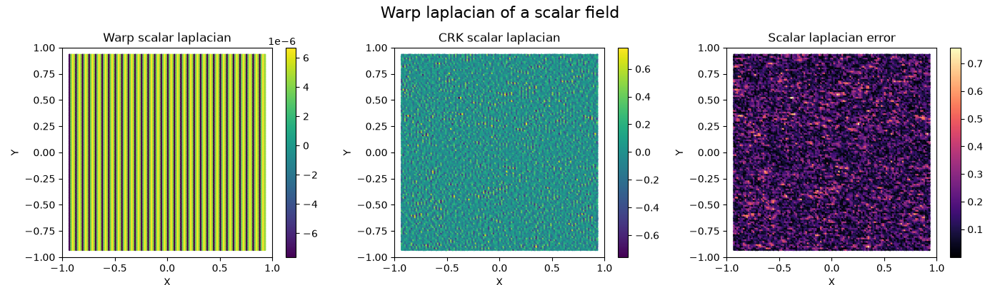

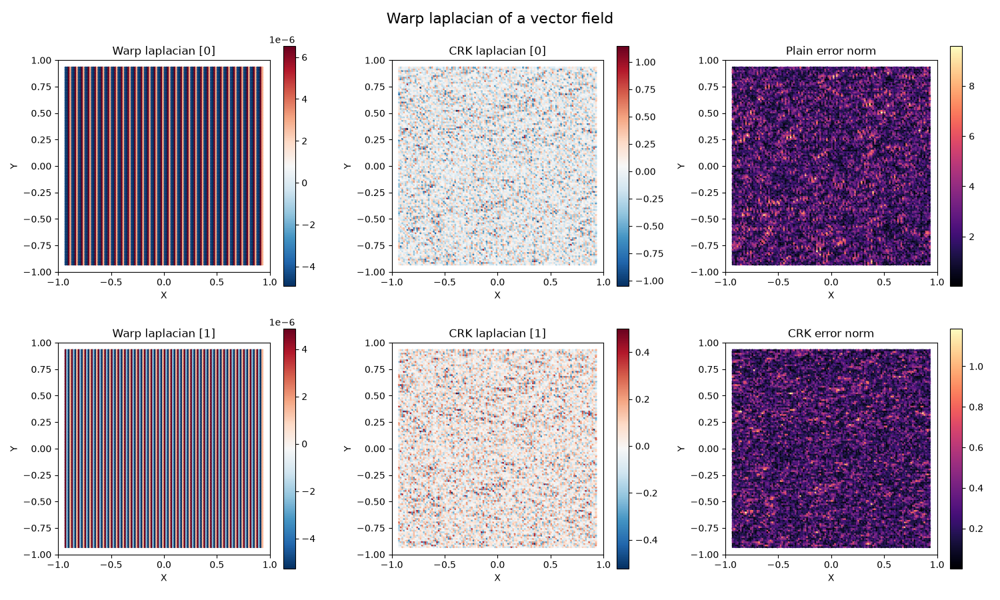

In [13]:
scalar_x = positions[:, 0]
scalar_y = positions[:, 1]
scalar_jittered_x = jittered_particles.positions[:, 0]
scalar_jittered_y = jittered_particles.positions[:, 1]

if field_mode == "periodic_sinusoidal":
    scalar_field = torch.sin(math.pi * scalar_x) + torch.cos(math.pi * scalar_y)
    scalar_field_jittered = torch.sin(math.pi * scalar_jittered_x) + torch.cos(math.pi * scalar_jittered_y)
    analytic_scalar_laplacian = -math.pi ** 2 * torch.sin(math.pi * scalar_x) - math.pi ** 2 * torch.cos(math.pi * scalar_y)
    analytic_scalar_laplacian_jittered = -math.pi ** 2 * torch.sin(math.pi * scalar_jittered_x) - math.pi ** 2 * torch.cos(math.pi * scalar_jittered_y)
else:
    scalar_field = 1.5 * scalar_x - 0.25 * scalar_y
    scalar_field_jittered = 1.5 * scalar_jittered_x - 0.25 * scalar_jittered_y
    analytic_scalar_laplacian = torch.zeros_like(scalar_x)
    analytic_scalar_laplacian_jittered = torch.zeros_like(scalar_jittered_x)

scalar_laplacian_warp = warpOperation(
    particles,
    queryValues=scalar_field,
    referenceValues=scalar_field,
    operationProperties=OperationProperties(
        kernel=kernel,
        supportMode=supportMode,
        operation=WarpOperation.Laplacian,
        gradientMode=GradientScheme.Difference,
        laplacianMode=LaplacianScheme.Default,
        operationMode=OperationDirection.AllToAll,
    ),
    adjacency=adjacency,
    domain=domain,
).squeeze()

scalar_laplacian_plain_jittered = warpOperation(
    jittered_particles,
    queryValues=scalar_field_jittered,
    referenceValues=scalar_field_jittered,
    operationProperties=OperationProperties(
        kernel=kernel,
        supportMode=supportMode,
        operation=WarpOperation.Laplacian,
        gradientMode=GradientScheme.Difference,
        laplacianMode=LaplacianScheme.Default,
        operationMode=OperationDirection.AllToAll,
    ),
    adjacency=jittered_adjacency,
    domain=domain,
).squeeze()

scalar_laplacian_crk = warpOperation(
    jittered_particles,
    queryValues=scalar_field_jittered,
    referenceValues=scalar_field_jittered,
    operationProperties=OperationProperties(
        kernel=kernel,
        supportMode=SupportScheme.SuperSymmetric,
        operation=WarpOperation.Laplacian,
        gradientMode=GradientScheme.Difference,
        laplacianMode=LaplacianScheme.Default,
        operationMode=OperationDirection.AllToAll,
    ),
    adjacency=jittered_adjacency,
    domain=domain,
    crkState=crk_state,
    queryVolumes=apparent_area,
    referenceVolumes=apparent_area,
).squeeze()

scalar_laplacian_warp_error = torch.abs(scalar_laplacian_warp - analytic_scalar_laplacian)
scalar_laplacian_plain_error = torch.abs(scalar_laplacian_plain_jittered - analytic_scalar_laplacian_jittered)
scalar_laplacian_crk_error = torch.abs(scalar_laplacian_crk - analytic_scalar_laplacian_jittered)

fig, axis = plt.subplots(1, 3, figsize=(14, 4), squeeze=False)
plot_scalar_field(axis[0, 0], positions[plot_mask], scalar_laplacian_warp[plot_mask], "Warp scalar laplacian", cmap="viridis", marker_size=markerSize, domain=domain)
plot_scalar_field(axis[0, 1], jittered_particles.positions[plot_mask], scalar_laplacian_crk[plot_mask], "CRK scalar laplacian", cmap="viridis", marker_size=markerSize, domain=domain)
plot_scalar_field(axis[0, 2], jittered_particles.positions[plot_mask], scalar_laplacian_crk_error[plot_mask], "Scalar laplacian error", cmap="magma", marker_size=markerSize, domain=domain)
fig.suptitle("Warp laplacian of a scalar field", fontsize=16)
fig.tight_layout()
print("Scalar laplacian Warp MAE:", scalar_laplacian_warp_error.mean().item())
print("Scalar laplacian plain jittered MAE:", scalar_laplacian_plain_error.mean().item())
print("Scalar laplacian CRK MAE:", scalar_laplacian_crk_error.mean().item())

vector_laplacian_warp = warpOperation(
    particles,
    queryValues=vector_field,
    referenceValues=vector_field,
    operationProperties=OperationProperties(
        kernel=kernel,
        supportMode=supportMode,
        operation=WarpOperation.Laplacian,
        gradientMode=GradientScheme.Difference,
        laplacianMode=LaplacianScheme.Default,
        operationMode=OperationDirection.AllToAll,
    ),
    adjacency=adjacency,
    domain=domain,
)

if field_mode == "periodic_sinusoidal":
    vector_field_jittered = torch.stack((torch.sin(math.pi * scalar_jittered_x), torch.cos(math.pi * scalar_jittered_y)), dim=-1)
    analytic_vector_laplacian = torch.stack((-math.pi ** 2 * torch.sin(math.pi * vector_x), -math.pi ** 2 * torch.cos(math.pi * vector_y)), dim=-1)
    analytic_vector_laplacian_jittered = torch.stack((-math.pi ** 2 * torch.sin(math.pi * scalar_jittered_x), -math.pi ** 2 * torch.cos(math.pi * scalar_jittered_y)), dim=-1)
else:
    vector_field_jittered = make_linear_vector_field(scalar_jittered_x, scalar_jittered_y)
    analytic_vector_laplacian = torch.zeros_like(vector_field)
    analytic_vector_laplacian_jittered = torch.zeros_like(vector_field_jittered)

vector_laplacian_plain_jittered = warpOperation(
    jittered_particles,
    queryValues=vector_field_jittered,
    referenceValues=vector_field_jittered,
    operationProperties=OperationProperties(
        kernel=kernel,
        supportMode=supportMode,
        operation=WarpOperation.Laplacian,
        gradientMode=GradientScheme.Difference,
        laplacianMode=LaplacianScheme.Default,
        operationMode=OperationDirection.AllToAll,
    ),
    adjacency=jittered_adjacency,
    domain=domain,
)

vector_laplacian_crk = warpOperation(
    jittered_particles,
    queryValues=vector_field_jittered,
    referenceValues=vector_field_jittered,
    operationProperties=OperationProperties(
        kernel=kernel,
        supportMode=SupportScheme.SuperSymmetric,
        operation=WarpOperation.Laplacian,
        gradientMode=GradientScheme.Difference,
        laplacianMode=LaplacianScheme.Default,
        operationMode=OperationDirection.AllToAll,
    ),
    adjacency=jittered_adjacency,
    domain=domain,
    crkState=crk_state,
    queryVolumes=apparent_area,
    referenceVolumes=apparent_area,
)

vector_laplacian_warp_error = torch.abs(vector_laplacian_warp - analytic_vector_laplacian)
vector_laplacian_plain_error = torch.abs(vector_laplacian_plain_jittered - analytic_vector_laplacian_jittered)
vector_laplacian_crk_error = torch.abs(vector_laplacian_crk - analytic_vector_laplacian_jittered)

fig, axis = plt.subplots(2, 3, figsize=(15, 9), squeeze=False)
plot_scalar_field(axis[0, 0], positions[plot_mask], vector_laplacian_warp[:, 0][plot_mask], "Warp laplacian [0]", cmap="RdBu_r", marker_size=markerSize, domain=domain)
plot_scalar_field(axis[1, 0], positions[plot_mask], vector_laplacian_warp[:, 1][plot_mask], "Warp laplacian [1]", cmap="RdBu_r", marker_size=markerSize, domain=domain)
plot_scalar_field(axis[0, 1], jittered_particles.positions[plot_mask], vector_laplacian_crk[:, 0][plot_mask], "CRK laplacian [0]", cmap="RdBu_r", marker_size=markerSize, domain=domain)
plot_scalar_field(axis[1, 1], jittered_particles.positions[plot_mask], vector_laplacian_crk[:, 1][plot_mask], "CRK laplacian [1]", cmap="RdBu_r", marker_size=markerSize, domain=domain)
plot_scalar_field(axis[0, 2], jittered_particles.positions[plot_mask], vector_laplacian_plain_error.norm(dim=1)[plot_mask], "Plain error norm", cmap="magma", marker_size=markerSize, domain=domain)
plot_scalar_field(axis[1, 2], jittered_particles.positions[plot_mask], vector_laplacian_crk_error.norm(dim=1)[plot_mask], "CRK error norm", cmap="magma", marker_size=markerSize, domain=domain)
fig.suptitle("Warp laplacian of a vector field", fontsize=16)
fig.tight_layout()
print("Vector laplacian Warp MAE:", vector_laplacian_warp_error.norm(dim=1).mean().item())
print("Vector laplacian plain jittered MAE:", vector_laplacian_plain_error.norm(dim=1).mean().item())
print("Vector laplacian CRK MAE:", vector_laplacian_crk_error.norm(dim=1).mean().item())
